In [21]:
import cv2
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt 
import seaborn as sns
import pandas as pd
import numpy as np
import tensorflow as tf
import os
from pathlib import Path

%matplotlib inline

Load all results from the `prepare_ILSVR_models_from_paper` notebook.

In [2]:
val_imgs_kodak = ['selfsupervised-denoising-master/datasets/kodak/{}'.format(i) for i in os.listdir('selfsupervised-denoising-master/datasets/kodak')]

gauss25_blindspot_sigma_global = ['results/_eval/00014-eval-ilsvrc-kodak-3c-gauss25-mb1-iter20k-blindspot-global-EVAL_gauss25-blindspot-sigma_global/img/{}'.format(i) for i in os.listdir('results/_eval/00014-eval-ilsvrc-kodak-3c-gauss25-mb1-iter20k-blindspot-global-EVAL_gauss25-blindspot-sigma_global/img/')]
gauss5_50_blindspot_sigma_per_image = ['results/_eval/00015-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-blindspot-per_image-EVAL_gauss5_50-blindspot-sigma_per_image/img/{}'.format(i) for i in os.listdir('results/_eval/00015-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-blindspot-per_image-EVAL_gauss5_50-blindspot-sigma_per_image/img/')]
gauss5_50_n2n = ['results/_eval/00016-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-n2n-EVAL_gauss5_50-n2n/img/{}'.format(i) for i in os.listdir('results/_eval/00016-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-n2n-EVAL_gauss5_50-n2n/img/')]
gauss5_50_n2c = ['results/_eval/00017-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-n2c-EVAL_gauss5_50-n2c/img/{}'.format(i) for i in os.listdir('results/_eval/00017-eval-ilsvrc-kodak-3c-gauss5_50-mb1-iter20k-n2c-EVAL_gauss5_50-n2c/img/')]

poisson30_blindspot_sigma_global = ['results/_eval/00018-eval-ilsvrc-kodak-3c-poisson30-mb1-iter2m-blindspot-global-EVAL_poisson30-blindspot-sigma_global/img/{}'.format(i) for i in os.listdir('results/_eval/00018-eval-ilsvrc-kodak-3c-poisson30-mb1-iter2m-blindspot-global-EVAL_poisson30-blindspot-sigma_global/img/')]
poisson5_50_blindspot_sigma_per_image = ['results/_eval/00019-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-blindspot-per_image-EVAL_poisson5_50-blindspot-sigma_per_image/img/{}'.format(i) for i in os.listdir('results/_eval/00019-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-blindspot-per_image-EVAL_poisson5_50-blindspot-sigma_per_image/img/')]
poisson5_50_n2n = ['results/_eval/00020-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-n2n-EVAL_poisson5_50-n2n/img/{}'.format(i) for i in os.listdir('results/_eval/00020-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-n2n-EVAL_poisson5_50-n2n/img/')]
poisson5_50_n2c = ['results/_eval/00021-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-n2c-EVAL_poisson5_50-n2c/img/{}'.format(i) for i in os.listdir('results/_eval/00021-eval-ilsvrc-kodak-3c-poisson5_50-mb1-iter20k-n2c-EVAL_poisson5_50-n2c/img/')]

impulse50_blindspot_sigma_global = ['results/_eval/00022-eval-ilsvrc-kodak-3c-impulse50-mb1-iter4m-blindspot-global-EVAL_impulse50-blindspot-sigma_global/img/{}'.format(i) for i in os.listdir('results/_eval/00022-eval-ilsvrc-kodak-3c-impulse50-mb1-iter4m-blindspot-global-EVAL_impulse50-blindspot-sigma_global/img/')]
impulse0_100_blindspot_sigma_per_image = ['results/_eval/00023-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter4m-blindspot-per_image-EVAL_impulse0_100-blindspot-sigma_per_image/img/{}'.format(i) for i in os.listdir('results/_eval/00023-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter4m-blindspot-per_image-EVAL_impulse0_100-blindspot-sigma_per_image/img/')]
impulse0_100_n2n = ['results/_eval/00024-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter16m-n2n-EVAL_impulse0_100-n2n/img/{}'.format(i) for i in os.listdir('results/_eval/00024-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter16m-n2n-EVAL_impulse0_100-n2n/img/')]
impulse0_100_n2c = ['results/_eval/00025-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter16m-n2c-EVAL_impulse0_100-n2c/img/{}'.format(i) for i in os.listdir('results/_eval/00025-eval-ilsvrc-kodak-3c-impulse0_100-mb1-iter16m-n2c-EVAL_impulse0_100-n2c/img/')]

In [3]:
def read_and_process_image(list_of_images):
    imglist = [] # images
    
    for image in list_of_images:
        imglist.append(mpimg.imread(image))
    
    return imglist

In [4]:
val_imgs_kodak = read_and_process_image(val_imgs_kodak)

gauss25_blindspot_sigma_global = read_and_process_image(gauss25_blindspot_sigma_global)
gauss5_50_blindspot_sigma_per_image = read_and_process_image(gauss5_50_blindspot_sigma_per_image)
gauss5_50_n2n = read_and_process_image(gauss5_50_n2n)
gauss5_50_n2c = read_and_process_image(gauss5_50_n2c)

poisson30_blindspot_sigma_global = read_and_process_image(poisson30_blindspot_sigma_global)
poisson5_50_blindspot_sigma_per_image = read_and_process_image(poisson5_50_blindspot_sigma_per_image)
poisson5_50_n2n = read_and_process_image(poisson5_50_n2n)
poisson5_50_n2c = read_and_process_image(poisson5_50_n2c)

impulse50_blindspot_sigma_global = read_and_process_image(impulse50_blindspot_sigma_global)
impulse0_100_blindspot_sigma_per_image = read_and_process_image(impulse0_100_blindspot_sigma_per_image)
impulse0_100_n2n = read_and_process_image(impulse0_100_n2n)
impulse0_100_n2c = read_and_process_image(impulse0_100_n2c)

all_results = [gauss25_blindspot_sigma_global, gauss5_50_blindspot_sigma_per_image, gauss5_50_n2n, gauss5_50_n2c, \
               poisson30_blindspot_sigma_global, poisson5_50_blindspot_sigma_per_image, poisson5_50_n2n, poisson5_50_n2c, \
               impulse50_blindspot_sigma_global, impulse0_100_blindspot_sigma_per_image, impulse0_100_n2n, impulse0_100_n2c]

Some visualisations with the Kodak validation dataset.

In [5]:
def plot_images(images, n_plots=5):
    fig, ax = plt.subplots(1, n_plots, figsize=(5*n_plots, 4))

    for i, a in zip(images, ax):
        a.imshow(i)
        a.axis('off')

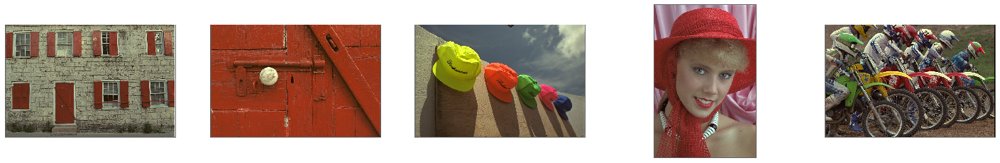

In [6]:
# Pure Plots
plot_images(val_imgs_kodak)

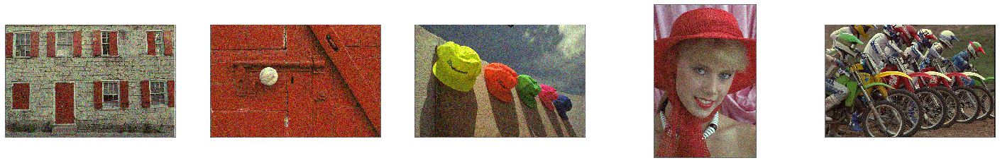

In [7]:
# Noisy Plots (Gaussian 5-50)
plot_images(gauss5_50_blindspot_sigma_per_image[0::5])

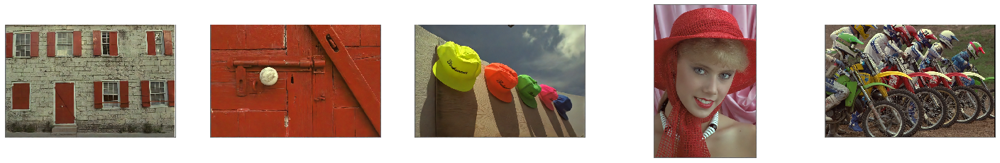

In [8]:
# Denoised Plots (Gaussian 5-50)
plot_images(gauss5_50_blindspot_sigma_per_image[2::5])

Calculate and compare average metrics for validation with the paper's results.

In [9]:
from skimage.metrics import structural_similarity, mean_squared_error

def MSE(pure, target):
    return mean_squared_error(pure, target)

def PSNR(pure, target, max_val=1):
    return (tf.image.psnr(pure, target, max_val).numpy())

def SSIM_cv(pure, target):
    return structural_similarity(pure, target, dynamic_range=1, multichannel=True)

In [10]:
# Calculate Average MSE
def calc_avg_mse(true_imgs, measured_imgs, noisy=False):
    if (noisy):
        measured_imgs = measured_imgs[0::5]
    else:
        measured_imgs = measured_imgs[2::5]
    mse_summed = 0
    for i in range(0, len(measured_imgs)):
        mse_summed += MSE(true_imgs[i], measured_imgs[i])
    return (mse_summed/len(measured_imgs))

# Calculate Average PSNR
def calc_avg_psnr(true_imgs, measured_imgs, noisy=False):
    if (noisy):
        measured_imgs = measured_imgs[0::5]
    else:
        measured_imgs = measured_imgs[2::5]
    pnsr_summed = 0
    for i in range(0, len(measured_imgs)):
        pnsr_summed += PSNR(true_imgs[i], measured_imgs[i])
    return (pnsr_summed/len(measured_imgs))

# Calculate Average Structural Similarity Index
def calc_avg_ssim(true_imgs, measured_imgs, noisy=False):
    if (noisy):
        measured_imgs = measured_imgs[0::5]
    else:
        measured_imgs = measured_imgs[2::5]
    ssim_summed = 0
    for i in range(0, len(measured_imgs)):
        ssim_summed += SSIM_cv(true_imgs[i], measured_imgs[i])
    return (ssim_summed/len(measured_imgs))

In [11]:
all_results_index = ['gauss25_blindspot_sigma_global', 'gauss5_50_blindspot_sigma_per_image', 'gauss5_50_n2n', 'gauss5_50_n2c', \
                     'poisson30_blindspot_sigma_global', 'poisson5_50_blindspot_sigma_per_image', 'poisson5_50_n2n', 'poisson5_50_n2c', \
                     'impulse50_blindspot_sigma_global', 'impulse0_100_blindspot_sigma_per_image', 'impulse0_100_n2n', 'impulse0_100_n2c']
denoised_psnrs = pd.DataFrame({"Denoised Images (PSNR)": [calc_avg_psnr(val_imgs_kodak, i) for i in all_results]})
denoised_mses = pd.DataFrame({"Denoised Images (MSE)": [calc_avg_mse(val_imgs_kodak, i) for i in all_results]})
denoised_ssims = pd.DataFrame({"Denoised Images (SSIM)": [calc_avg_ssim(val_imgs_kodak, i) for i in all_results]}) 
compare_denoised = pd.concat([denoised_psnrs, denoised_mses, denoised_ssims], axis=1)
compare_denoised.index = all_results_index

Resulting metrics from the denoised Kodak validation images.

In [12]:
compare_denoised.round(3)

,Denoised Images (PSNR),Denoised Images (MSE),Denoised Images (SSIM)
gauss25_blindspot_sigma_global,32.432,0.001,0.942
gauss5_50_blindspot_sigma_per_image,33.352,0.001,0.945
gauss5_50_n2n,33.437,0.001,0.947
gauss5_50_n2c,33.444,0.001,0.947
poisson30_blindspot_sigma_global,31.696,0.001,0.936
poisson5_50_blindspot_sigma_per_image,30.605,0.001,0.917
poisson5_50_n2n,30.911,0.001,0.922
poisson5_50_n2c,30.915,0.001,0.922
impulse50_blindspot_sigma_global,32.927,0.001,0.959
impulse0_100_blindspot_sigma_per_image,33.233,0.004,0.918


Export the results so that we can compare them later with our implementation of the paper's models.

In [22]:
compare_denoised.to_csv(str(Path('./denoised_metrics_from_paper.csv')), sep=',')

In [13]:
noisy_psnrs = pd.DataFrame({"Noisy Images (PSNR)": [calc_avg_psnr(val_imgs_kodak, i, noisy=True) for i in all_results]})
noisy_mses = pd.DataFrame({"Noisy Images (MSE)": [calc_avg_mse(val_imgs_kodak, i, noisy=True) for i in all_results]})
noisy_ssims = pd.DataFrame({"Noisy Images (SSIM)": [calc_avg_ssim(val_imgs_kodak, i, noisy=True) for i in all_results]}) 
compare_noisy = pd.concat([noisy_psnrs, noisy_mses, noisy_ssims], axis=1)
compare_noisy.index = all_results_index

Metrics from the noisy images as measured against the pure ground truth set.

In [14]:
compare_noisy.round(3)

,Noisy Images (PSNR),Noisy Images (MSE),Noisy Images (SSIM)
gauss25_blindspot_sigma_global,20.438,0.009,0.473
gauss5_50_blindspot_sigma_per_image,22.020,0.011,0.535
gauss5_50_n2n,22.020,0.011,0.535
gauss5_50_n2c,22.020,0.011,0.535
poisson30_blindspot_sigma_global,18.984,0.013,0.432
poisson5_50_blindspot_sigma_per_image,17.521,0.021,0.369
poisson5_50_n2n,17.521,0.021,0.369
poisson5_50_n2c,17.521,0.021,0.369
impulse50_blindspot_sigma_global,11.585,0.071,0.121
impulse0_100_blindspot_sigma_per_image,13.574,0.062,0.229


In [15]:
gauss25_blindspot_sigma_global_dn = gauss25_blindspot_sigma_global[2::5]
gauss5_50_blindspot_sigma_per_image_dn = gauss5_50_blindspot_sigma_per_image[2::5]
gauss5_50_n2n_dn = gauss5_50_n2n[2::5]
gauss5_50_n2c_dn = gauss5_50_n2c[2::5]
gauss5_50_noisy = gauss5_50_n2c[0::5]

poisson30_blindspot_sigma_global_dn = poisson30_blindspot_sigma_global[2::5]
poisson5_50_blindspot_sigma_per_image_dn = poisson5_50_blindspot_sigma_per_image[2::5]
poisson5_50_n2n_dn = poisson5_50_n2n[2::5]
poisson5_50_n2c_dn = poisson5_50_n2c[2::5]
poisson5_50_noisy = poisson5_50_n2c[0::5]

impulse50_blindspot_sigma_global_dn = impulse50_blindspot_sigma_global[2::5]
impulse0_100_blindspot_sigma_per_image_dn = impulse0_100_blindspot_sigma_per_image[2::5]
impulse0_100_n2n_dn = impulse0_100_n2n[2::5]
impulse0_100_n2c_dn = impulse0_100_n2c[2::5]
impulse0_100_noisy = impulse0_100_n2c[0::5]

Some visualisations for the results.

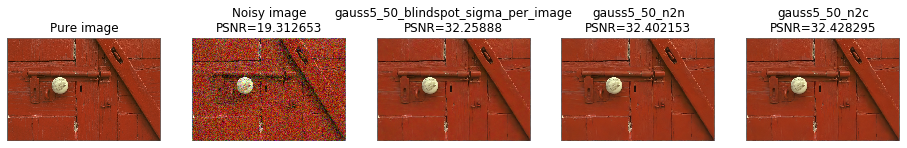

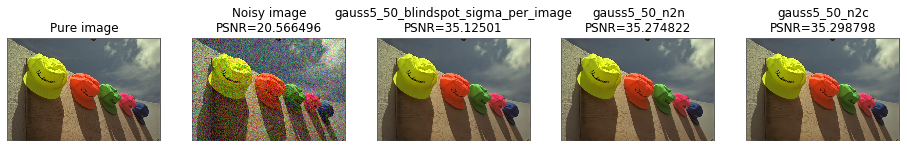

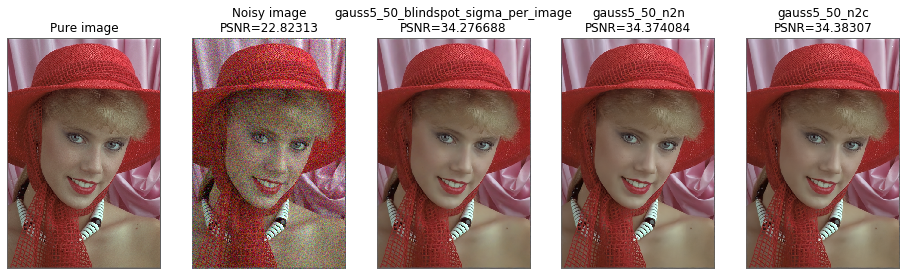

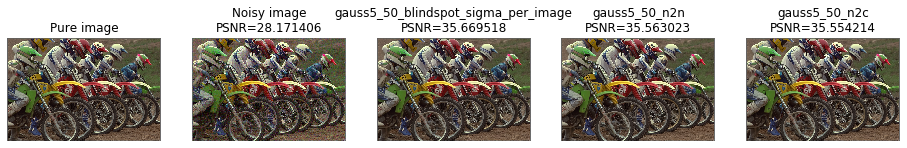

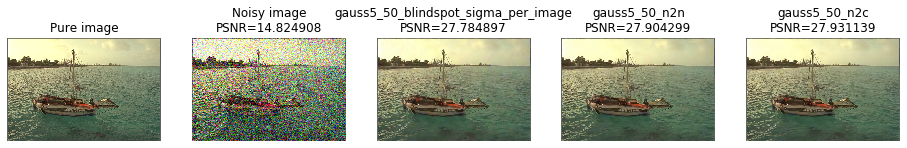

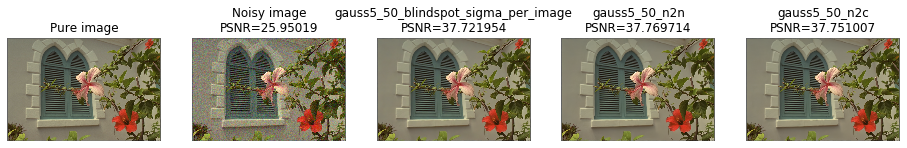

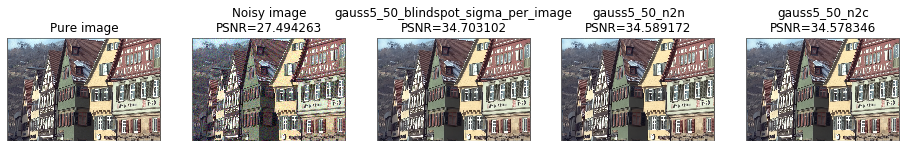

In [16]:
# Plot denoised images (Gaussian Noise)
for i in range(1, 8):
    fig, axes = plt.subplots(1, 5)
    fig.set_size_inches(16, 16)
    
    axes[0].imshow(val_imgs_kodak[i])
    axes[0].set_title('Pure image')
#     axes[1].imshow(gauss25_blindspot_sigma_global_dn[i])
#     axes[1].set_title(all_results_index[0] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], gauss25_blindspot_sigma_global_dn[i])))
    axes[1].imshow(gauss5_50_noisy[i])
    axes[1].set_title('Noisy image' +'\nPSNR='+str(PSNR(val_imgs_kodak[i], gauss5_50_noisy[i])))
    axes[2].imshow(gauss5_50_blindspot_sigma_per_image_dn[i])
    axes[2].set_title(all_results_index[1] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], gauss5_50_blindspot_sigma_per_image_dn[i])))
    axes[3].imshow(gauss5_50_n2n_dn[i])
    axes[3].set_title(all_results_index[2] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], gauss5_50_n2n_dn[i])))
    axes[4].imshow(gauss5_50_n2c_dn[i])
    axes[4].set_title(all_results_index[3] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], gauss5_50_n2c_dn[i])))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); axes[3].axis('off'); axes[4].axis('off')
    plt.show();

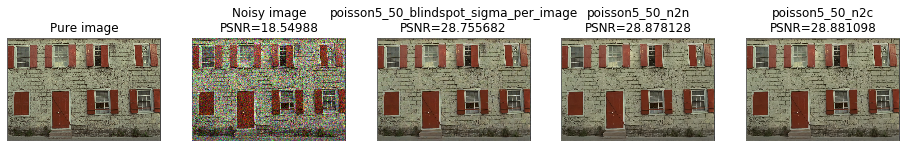

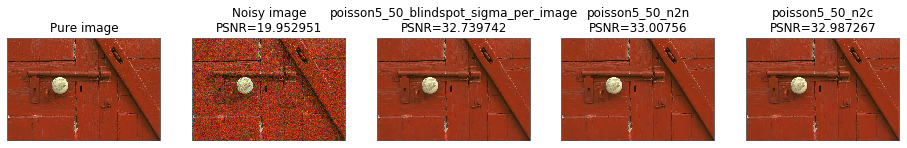

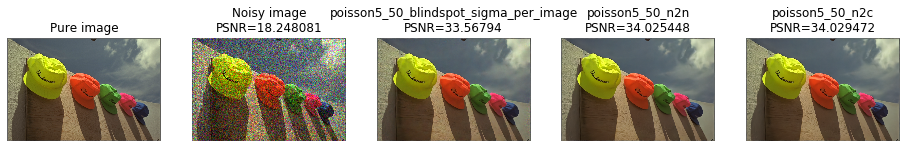

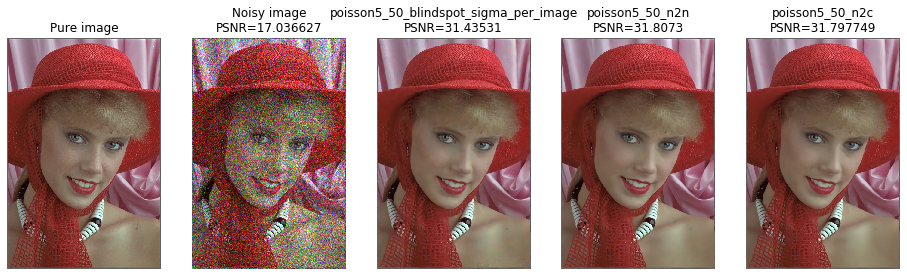

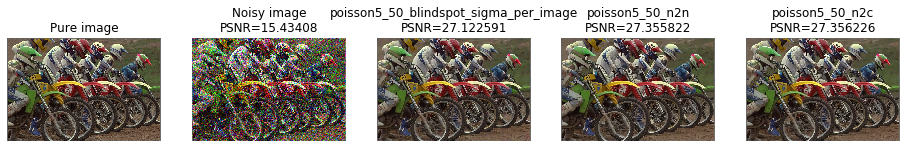

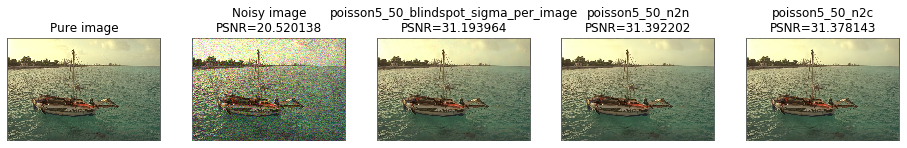

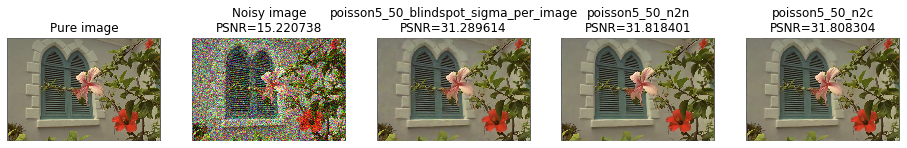

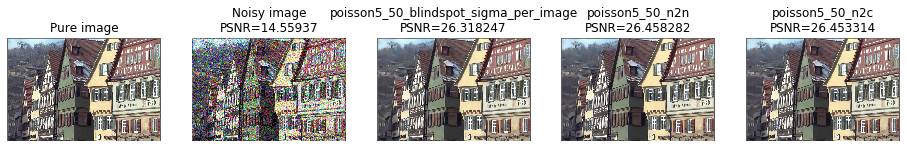

In [17]:
# Plot denoised images (Poisson Noise)
for i in range(0, 8):
    fig, axes = plt.subplots(1, 5)
    fig.set_size_inches(16, 16)
    
    axes[0].imshow(val_imgs_kodak[i])
    axes[0].set_title('Pure image')
#     axes[1].imshow(poisson30_blindspot_sigma_global_dn[i])
#     axes[1].set_title(all_results_index[4] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], poisson30_blindspot_sigma_global_dn[i])))
    axes[1].imshow(poisson5_50_noisy[i])
    axes[1].set_title('Noisy image' +'\nPSNR='+str(PSNR(val_imgs_kodak[i], poisson5_50_noisy[i])))
    axes[2].imshow(poisson5_50_blindspot_sigma_per_image_dn[i])
    axes[2].set_title(all_results_index[5] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], poisson5_50_blindspot_sigma_per_image_dn[i])))
    axes[3].imshow(poisson5_50_n2n_dn[i])
    axes[3].set_title(all_results_index[6] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], poisson5_50_n2n_dn[i])))
    axes[4].imshow(poisson5_50_n2c_dn[i])
    axes[4].set_title(all_results_index[7] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], poisson5_50_n2c_dn[i])))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); axes[3].axis('off'); axes[4].axis('off')
    plt.show();

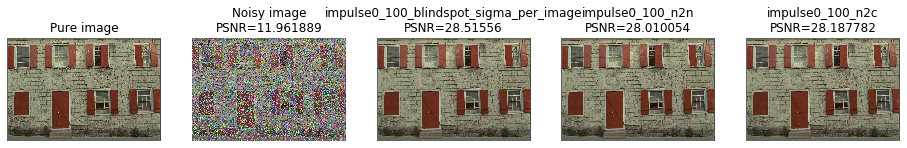

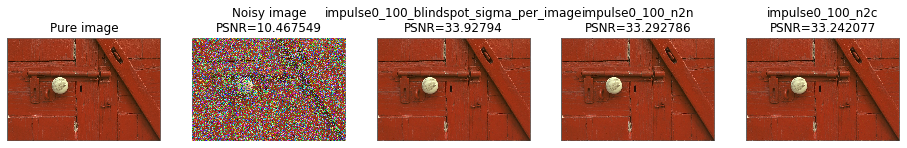

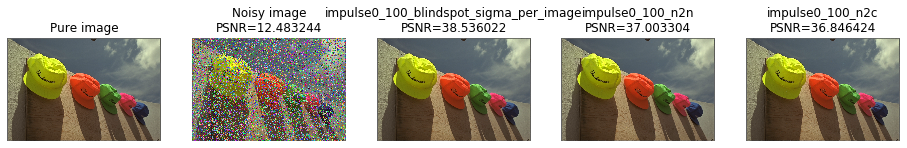

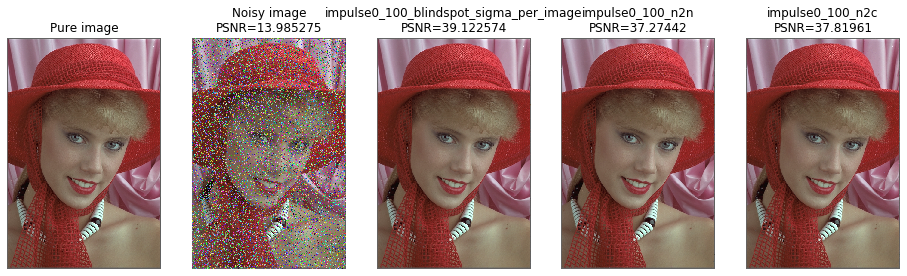

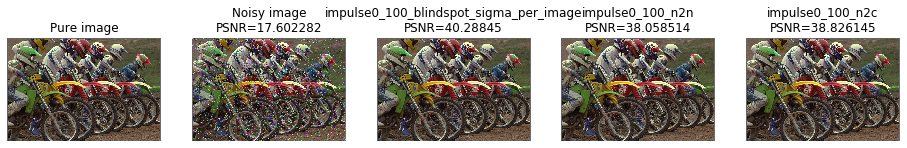

...

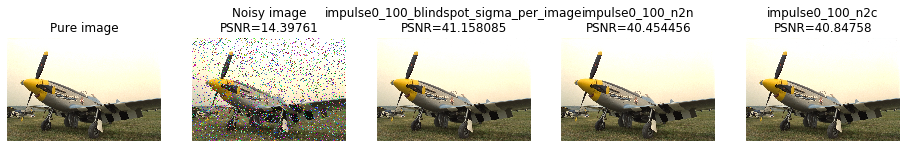

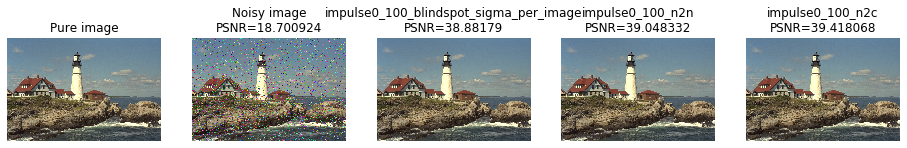

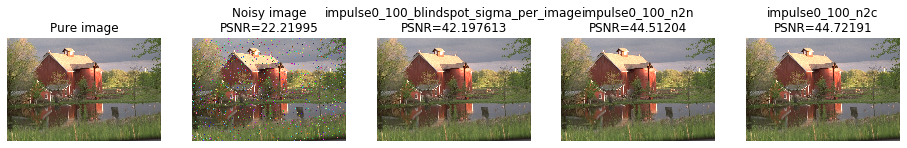

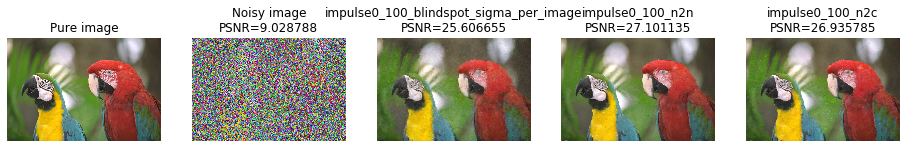

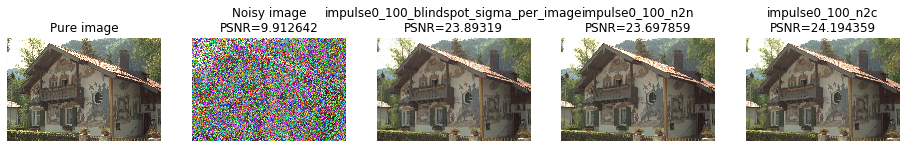

In [18]:
# Plot denoised images (Impulse Noise)
for i in range(0, 24):
    fig, axes = plt.subplots(1, 5)
    fig.set_size_inches(16, 16)
    
    axes[0].imshow(val_imgs_kodak[i])
    axes[0].set_title('Pure image')
#     axes[1].imshow(impulse50_blindspot_sigma_global_dn[i])
#     axes[1].set_title(all_results_index[8] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse50_blindspot_sigma_global_dn[i])))
    axes[1].imshow(impulse0_100_noisy[i])
    axes[1].set_title('Noisy image' +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_noisy[i])))
    axes[2].imshow(impulse0_100_blindspot_sigma_per_image_dn[i])
    axes[2].set_title(all_results_index[9] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_blindspot_sigma_per_image_dn[i])))
    axes[3].imshow(impulse0_100_n2n_dn[i])
    axes[3].set_title(all_results_index[10] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_n2n_dn[i])))
    axes[4].imshow(impulse0_100_n2c_dn[i])
    axes[4].set_title(all_results_index[11] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_n2c_dn[i])))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); axes[3].axis('off'); axes[4].axis('off')
    plt.show();

For impulse noise of varying alpha [0, 100], the model has difficulty in reconstructing the image when the noise is too heavy.

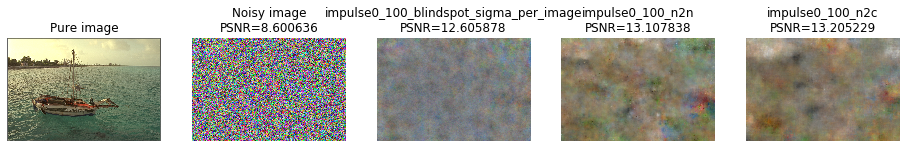

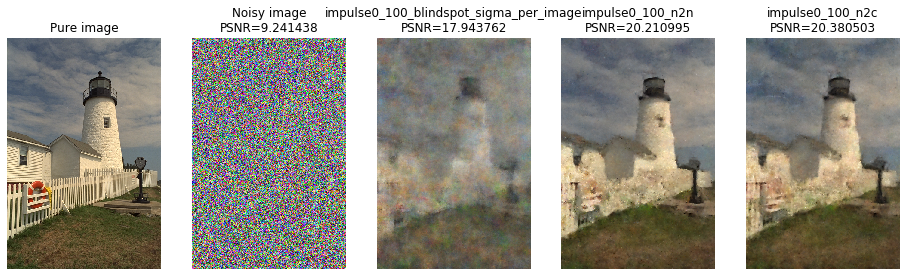

In [19]:
# Plot denoised images (Impulse Noise)
for i in [5, 18]:
    fig, axes = plt.subplots(1, 5)
    fig.set_size_inches(16, 16)
    
    axes[0].imshow(val_imgs_kodak[i])
    axes[0].set_title('Pure image')
#     axes[1].imshow(impulse50_blindspot_sigma_global_dn[i])
#     axes[1].set_title(all_results_index[8] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse50_blindspot_sigma_global_dn[i])))
    axes[1].imshow(impulse0_100_noisy[i])
    axes[1].set_title('Noisy image' +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_noisy[i])))
    axes[2].imshow(impulse0_100_blindspot_sigma_per_image_dn[i])
    axes[2].set_title(all_results_index[9] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_blindspot_sigma_per_image_dn[i])))
    axes[3].imshow(impulse0_100_n2n_dn[i])
    axes[3].set_title(all_results_index[10] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_n2n_dn[i])))
    axes[4].imshow(impulse0_100_n2c_dn[i])
    axes[4].set_title(all_results_index[11] +'\nPSNR='+str(PSNR(val_imgs_kodak[i], impulse0_100_n2c_dn[i])))
    axes[0].axis('off'); axes[1].axis('off'); axes[2].axis('off'); axes[3].axis('off'); axes[4].axis('off')
    plt.show();